# Segmentacion de Llantas - YOLO 12

<h2>Importante</h2>

Este notebook de Python ha sido desarrollado únicamente con fines educativos y de aprendizaje personal. No tiene propósitos comerciales ni de lucro.

El objetivo de este proyecto es aprender y explorar las capacidades de:
- YOLO (You Only Look Once) para detección de objetos en tiempo real
- Roboflow como plataforma para gestión y procesamiento de datasets de visión computacional
- Técnicas de detección de objetos y segmentación usando modelos de deep learning
- Implementación práctica de modelos de visión computacional

Este trabajo forma parte de un proceso de aprendizaje personal para comprender mejor las tecnologías de computer vision y sus aplicaciones.

____

In [1]:
# 1. CONFIGURACION GENERAL

import os
import random
import torch
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
from torchinfo import summary
import pandas as pd
import numpy as np

DATASET_PATH = os.getcwd() + "/data"
MODEL_SIZE = "n"  # Modelo nano para segmentación
data_yaml = os.path.join(DATASET_PATH, "data.yaml")

# Configurar dispositivo
device = 0 if torch.cuda.is_available() and torch.cuda.device_count() > 0 else "cpu"
print(f"Usando: {'GPU' if device == 0 else 'CPU'}")
print(f"Dataset: {os.path.exists(data_yaml)}")

Usando: GPU
Dataset: True


In [2]:
# 2. CARGAR O CONTINUAR MODELO DE SEGMENTACIÓN

model_path = f"modelo_yolo11{MODEL_SIZE}_seg.pt"
base_model = f"yolo11{MODEL_SIZE}-seg.pt"  # Modelo de segmentación

if os.path.exists(model_path):
    print(f"Continuando entrenamiento: {model_path}")
    model = YOLO(model_path)
else:
    print(f"Iniciando con modelo base: {base_model}")
    model = YOLO(base_model)

print(f"Modelo de segmentación cargado")

summary(model)

Iniciando con modelo base: yolo11n-seg.pt
Modelo de segmentación cargado


Layer (type:depth-idx)                                            Param #
YOLO                                                              --
├─SegmentationModel: 1-1                                          --
│    └─Sequential: 2-1                                            --
│    │    └─Conv: 3-1                                             (464)
│    │    └─Conv: 3-2                                             (4,672)
│    │    └─C3k2: 3-3                                             (6,640)
│    │    └─Conv: 3-4                                             (36,992)
│    │    └─C3k2: 3-5                                             (26,080)
│    │    └─Conv: 3-6                                             (147,712)
│    │    └─C3k2: 3-7                                             (87,040)
│    │    └─Conv: 3-8                                             (295,424)
│    │    └─C3k2: 3-9                                             (346,112)
│    │    └─SPPF: 3-10                        

In [3]:
# 3. ENTRENAMIENTO PARA SEGMENTACIÓN

results = model.train(
    data=data_yaml,
    epochs=100,
    patience=20,
    lr0=1e-5,
    lrf=5e-6,
    momentum=0.937,
    weight_decay=0.0005,
    warmup_epochs=5.0,
    imgsz=640,
    batch=-1,
    device=device,
    project="modelos_seg",
    name="yolo11_segmentacion",
    save=True,
    save_period=10,
    plots=True,
    val=True,
    cos_lr=True,
    amp=False,
    exist_ok=True,
    seed=35,
    multi_scale=True,
    freeze=4,  # congelar primeras capas para hacer transfer learning
    overlap_mask=True,  # Fusionar máscaras superpuestas
    mask_ratio=4,  # Ratio de submuestreo para máscaras
)

# Guardar modelo personalizado
best_model_path = "modelos_seg/yolo11_segmentacion/weights/best.pt"
if os.path.exists(best_model_path):
    import shutil

    shutil.copy2(best_model_path, model_path)
    print(f"Modelo guardado: {model_path}")

Ultralytics 8.3.201  Python-3.10.16 torch-2.8.0+cu128 CUDA:0 (NVIDIA GeForce RTX 3080 Laptop GPU, 8192MiB)
engine\trainer: agnostic_nms=False, amp=False, augment=False, auto_augment=randaugment, batch=-1, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=c:\Users\MIJAIL\Desktop\Aprendiendo_todo\YOLO_NEW\YOLO_SEG\wheel1/data\data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=4, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=1e-05, lrf=5e-06, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=True, name=yolo11_segmentacion, nbs=64, nms=False, opset=None, optimize=Fa

In [4]:
# 4. CARGAR MEJOR MODELO
best_model = YOLO(best_model_path if os.path.exists(best_model_path) else model_path)
summary(best_model)

Layer (type:depth-idx)                                            Param #
YOLO                                                              --
├─SegmentationModel: 1-1                                          --
│    └─Sequential: 2-1                                            --
│    │    └─Conv: 3-1                                             (464)
│    │    └─Conv: 3-2                                             (4,672)
│    │    └─C3k2: 3-3                                             (6,640)
│    │    └─Conv: 3-4                                             (36,992)
│    │    └─C3k2: 3-5                                             (26,080)
│    │    └─Conv: 3-6                                             (147,712)
│    │    └─C3k2: 3-7                                             (87,040)
│    │    └─Conv: 3-8                                             (295,424)
│    │    └─C3k2: 3-9                                             (346,112)
│    │    └─SPPF: 3-10                        

In [5]:
# 5. VALIDACIÓN CON MÉTRICAS DE SEGMENTACIÓN

try:
    valid_results = best_model.val(
        data=data_yaml, split="val", device=device, verbose=False
    )
    test_results = best_model.val(
        data=data_yaml, split="test", device=device, verbose=False
    )

    print("MÉTRICAS DE CAJAS DELIMITADORAS:")
    print(
        f"VALID - mAP50: {valid_results.box.map50:.4f}, mAP50-95: {valid_results.box.map:.4f}"
    )
    print(
        f"TEST  - mAP50: {test_results.box.map50:.4f}, mAP50-95: {test_results.box.map:.4f}"
    )

    print("\nMÉTRICAS DE MÁSCARAS:")
    print(
        f"VALID - mAP50: {valid_results.seg.map50:.4f}, mAP50-95: {valid_results.seg.map:.4f}"
    )
    print(
        f"TEST  - mAP50: {test_results.seg.map50:.4f}, mAP50-95: {test_results.seg.map:.4f}"
    )

except Exception as e:
    print(f"Error en validación: {e}")

Ultralytics 8.3.201  Python-3.10.16 torch-2.8.0+cu128 CUDA:0 (NVIDIA GeForce RTX 3080 Laptop GPU, 8192MiB)
YOLO11n-seg summary (fused): 113 layers, 2,834,763 parameters, 0 gradients, 9.6 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 157.844.9 MB/s, size: 32.9 KB)
val: Scanning C:\Users\MIJAIL\Desktop\Aprendiendo_todo\YOLO_NEW\YOLO_SEG\wheel1\data\valid\labels.cache... 34 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 34/34 27.2Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 0.6it/s 5.0s3.0ss
                   all         34         71      0.943       0.93      0.982      0.816       0.96      0.859      0.962      0.708
Speed: 5.0ms preprocess, 15.6ms inference, 0.0ms loss, 12.3ms postprocess per image
Results saved to C:\Users\MIJAIL\Desktop\Aprendiendo_todo\YOLO_NEW\YOLO_SEG\wheel1\runs\segment\val
Ultralytics 8.3.201  Python-3.10.16 torch-2.8.0+cu128

In [6]:
# 6. FUNCIÓN PARA SEGMENTACIÓN CON MÁSCARAS

import pandas as pd
import numpy as np


def segmentar_objetos(ruta_imagen, umbral_confianza=0.1, mostrar=True):
    """
    Realizar segmentación de instancias con máscaras
    """
    if not os.path.exists(ruta_imagen):
        print(f"No existe: {ruta_imagen}")
        return None

    results = best_model(
        ruta_imagen, device=device, verbose=False, conf=umbral_confianza
    )
    result = results[0]

    # Crear DataFrame con detecciones y máscaras
    detecciones_data = []

    if len(result.boxes) > 0:
        for i, (box, mask) in enumerate(
            zip(result.boxes, result.masks if result.masks else [])
        ):
            conf = float(box.conf[0])
            cls = int(box.cls[0])
            coords = box.xyxy[0].tolist()

            # Información de la máscara
            mask_area = 0
            if mask is not None:
                mask_array = mask.data[0].cpu().numpy()
                mask_area = np.sum(mask_array)

            detecciones_data.append(
                {
                    "imagen": os.path.basename(ruta_imagen),
                    "deteccion_id": i + 1,
                    "confianza": round(conf, 3),
                    "x1": round(coords[0], 1),
                    "y1": round(coords[1], 1),
                    "x2": round(coords[2], 1),
                    "y2": round(coords[3], 1),
                    "area_caja": round(
                        (coords[2] - coords[0]) * (coords[3] - coords[1]), 1
                    ),
                    "area_mascara": round(float(mask_area), 1),
                }
            )

    df_segmentaciones = pd.DataFrame(detecciones_data)

    # Mostrar información
    print(f"\nImagen: {os.path.basename(ruta_imagen)}")
    print(f"Segmentaciones encontradas: {len(df_segmentaciones)}")

    if len(df_segmentaciones) > 0:
        print(f"Confianza promedio: {df_segmentaciones['confianza'].mean():.3f}")
        print(
            f"Área promedio (píxeles): {df_segmentaciones['area_mascara'].mean():.1f}"
        )

    # Visualización con máscaras
    if mostrar and len(df_segmentaciones) > 0:
        img = cv2.imread(ruta_imagen)
        img_with_masks = img.copy()

        # Generar colores aleatorios para cada máscara
        colors = np.random.randint(0, 255, size=(len(result.boxes), 3), dtype=np.uint8)

        if result.masks:
            for i, (box, mask) in enumerate(zip(result.boxes, result.masks)):
                conf = float(box.conf[0])
                coords = box.xyxy[0].cpu().numpy().astype(int)

                # Dibujar máscara con transparencia
                mask_array = mask.data[0].cpu().numpy()
                color = colors[i].tolist()

                # Redimensionar máscara al tamaño original
                mask_resized = cv2.resize(mask_array, (img.shape[1], img.shape[0]))
                colored_mask = np.zeros_like(img)
                colored_mask[mask_resized > 0.5] = color

                # Aplicar máscara con transparencia
                img_with_masks = cv2.addWeighted(
                    img_with_masks, 1.0, colored_mask, 0.5, 0
                )

                # Dibujar borde de la caja
                cv2.rectangle(
                    img_with_masks,
                    (coords[0], coords[1]),
                    (coords[2], coords[3]),
                    color,
                    2,
                )

                # Texto con confianza
                label = f"{conf:.2f}"
                (text_width, text_height), _ = cv2.getTextSize(
                    label, cv2.FONT_HERSHEY_SIMPLEX, 0.6, 2
                )
                cv2.rectangle(
                    img_with_masks,
                    (coords[0], coords[1] - text_height - 10),
                    (coords[0] + text_width, coords[1]),
                    color,
                    -1,
                )
                cv2.putText(
                    img_with_masks,
                    label,
                    (coords[0], coords[1] - 5),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    0.6,
                    (255, 255, 255),
                    2,
                )

        # Mostrar resultado
        img_rgb = cv2.cvtColor(img_with_masks, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(12, 8))
        plt.imshow(img_rgb)
        plt.title(f"Segmentación: {os.path.basename(ruta_imagen)}")
        plt.axis("off")
        plt.show()

        # # Guardar resultado
        # output = f"segmentado_{os.path.basename(ruta_imagen)}"
        # cv2.imwrite(output, img_with_masks)
        # print(f"Imagen guardada: {output}")

    return df_segmentaciones

Usando umbral de confianza: 0.1

Imagen: 1C4HJXDN3KW686453-2019-Jeep-Wrangler-sp_walkaround_pic-1013-16x9-3840x2160-4K-20211203161225_jpg.rf.737f577dbcc69cf9df06e2a7e3a4b853.jpg
Segmentaciones encontradas: 3
Confianza promedio: 0.853
Área promedio (píxeles): 8923.0


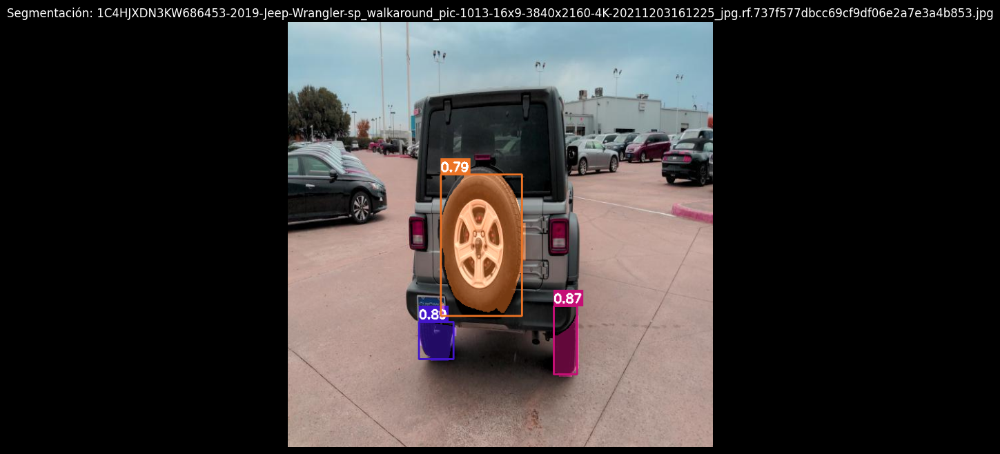


Imagen: 1C4PJLDB1LD504871-2020-Jeep-Cherokee-sp_walkaround_pic-1004-16x9-3840x2160-4K-20211217131256_jpg.rf.e25b605008c2365230c8fbe0a655ca24.jpg
Segmentaciones encontradas: 2
Confianza promedio: 0.833
Área promedio (píxeles): 3160.5


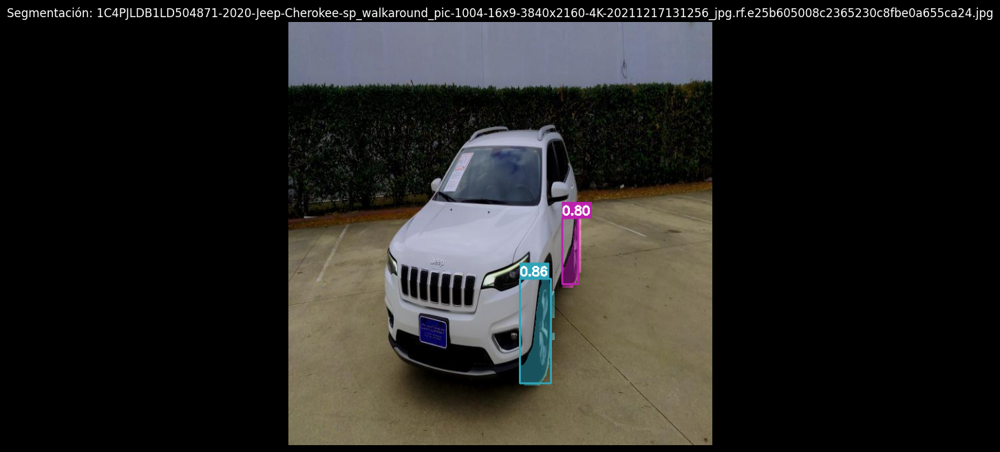


--- RESUMEN SEGMENTACIÓN ---
Imágenes procesadas: 2
Segmentaciones totales: 5
Área promedio de máscaras: 6618.0 píxeles


In [7]:
# 7. PRUEBAS EN IMÁGENES DE TEST

test_images_path = os.path.join(DATASET_PATH, "test", "images")
if os.path.exists(test_images_path):
    test_images = [
        f
        for f in os.listdir(test_images_path)
        if f.lower().endswith((".jpg", ".jpeg", ".png", ".bmp"))
    ]

    if test_images:
        selected = random.sample(test_images, min(2, len(test_images)))
        umbral = 0.1
        print(f"Usando umbral de confianza: {umbral}")

        todas_segmentaciones = []

        for img_name in selected:
            img_path = os.path.join(test_images_path, img_name)
            df_seg = segmentar_objetos(img_path, umbral_confianza=umbral, mostrar=True)

            if df_seg is not None and len(df_seg) > 0:
                todas_segmentaciones.append(df_seg)

        # Resumen
        if todas_segmentaciones:
            df_completo = pd.concat(todas_segmentaciones, ignore_index=True)
            print(f"\n--- RESUMEN SEGMENTACIÓN ---")
            print(f"Imágenes procesadas: {len(selected)}")
            print(f"Segmentaciones totales: {len(df_completo)}")
            print(
                f"Área promedio de máscaras: {df_completo['area_mascara'].mean():.1f} píxeles"
            )

Encontradas 5 imágenes:
  - input_imagen1.jpg
  - input_imagen2.jpg
  - input_imagen3.jpg
  - input_imagen4.jpg
  - input_imagen5.jpg

Procesando con umbral mínimo: 0.05

--- Segmentando: input_imagen1.jpg ---

Imagen: input_imagen1.jpg
Segmentaciones encontradas: 7
Confianza promedio: 0.600
Área promedio (píxeles): 3795.1


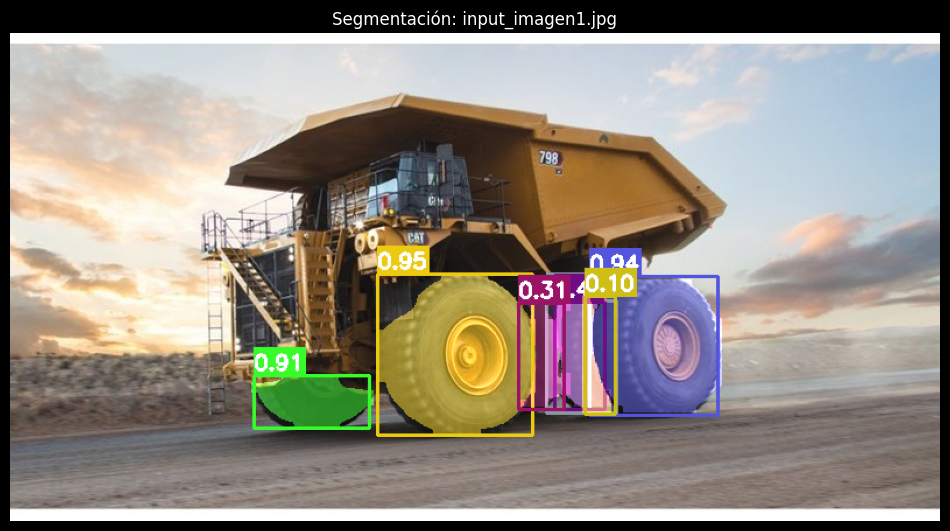

Área total segmentada: 26566.0 píxeles

--- Segmentando: input_imagen2.jpg ---

Imagen: input_imagen2.jpg
Segmentaciones encontradas: 6
Confianza promedio: 0.392
Área promedio (píxeles): 1517.7


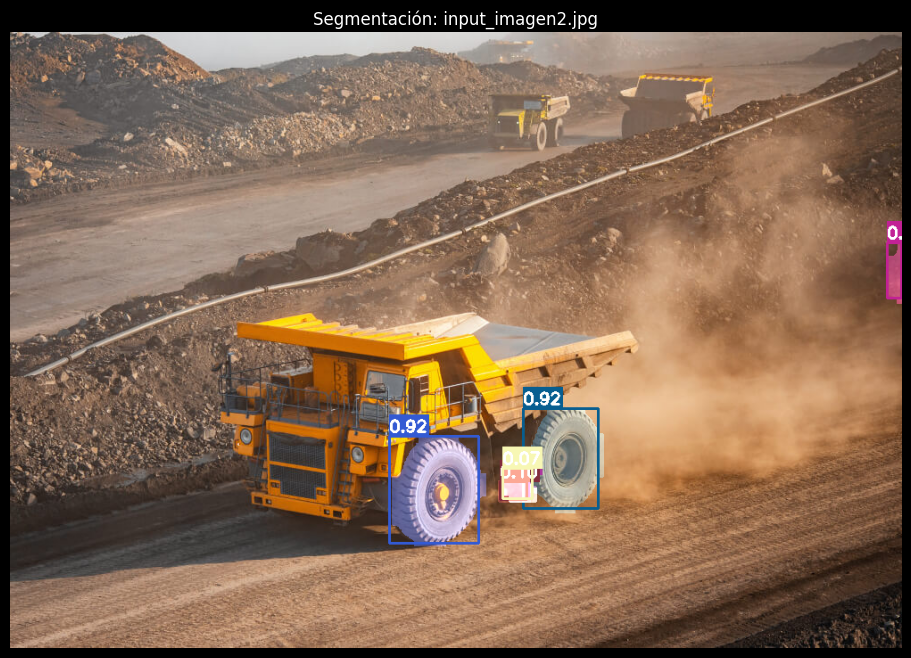

Área total segmentada: 9106.0 píxeles

--- Segmentando: input_imagen3.jpg ---

Imagen: input_imagen3.jpg
Segmentaciones encontradas: 5
Confianza promedio: 0.607
Área promedio (píxeles): 3415.4


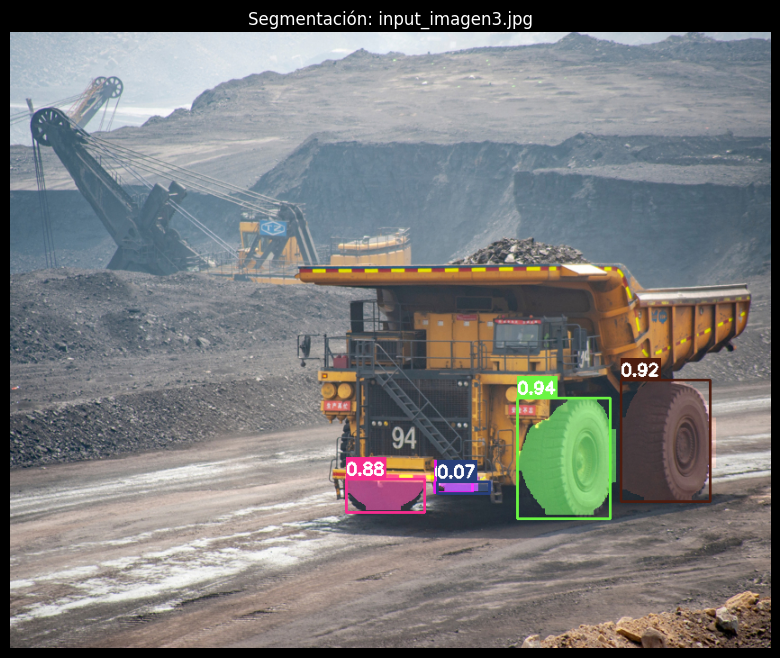

Área total segmentada: 17077.0 píxeles

--- Segmentando: input_imagen4.jpg ---

Imagen: input_imagen4.jpg
Segmentaciones encontradas: 8
Confianza promedio: 0.605
Área promedio (píxeles): 1863.4


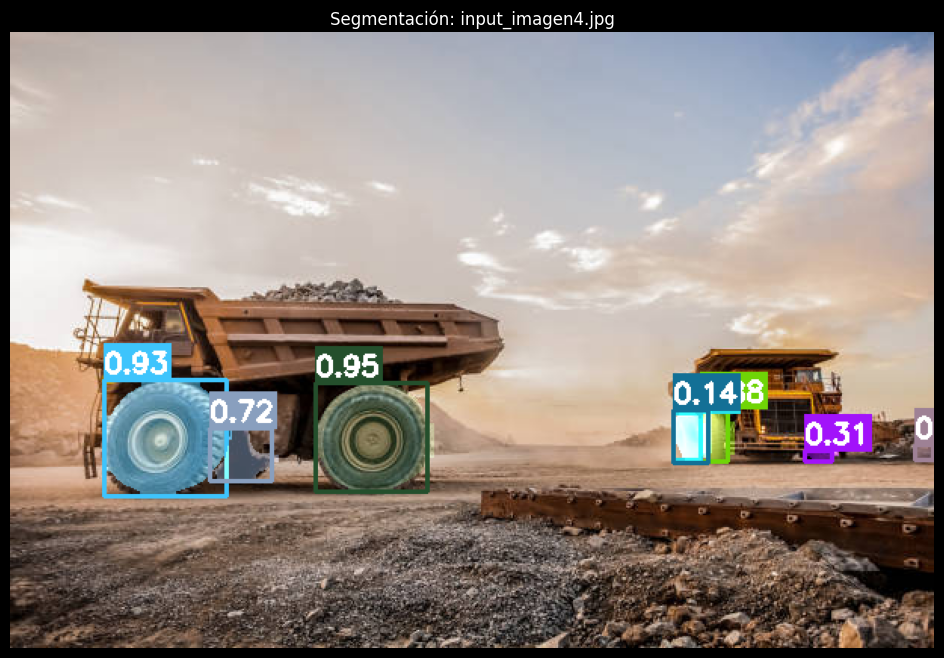

Área total segmentada: 14907.0 píxeles

--- Segmentando: input_imagen5.jpg ---

Imagen: input_imagen5.jpg
Segmentaciones encontradas: 7
Confianza promedio: 0.643
Área promedio (píxeles): 2063.0


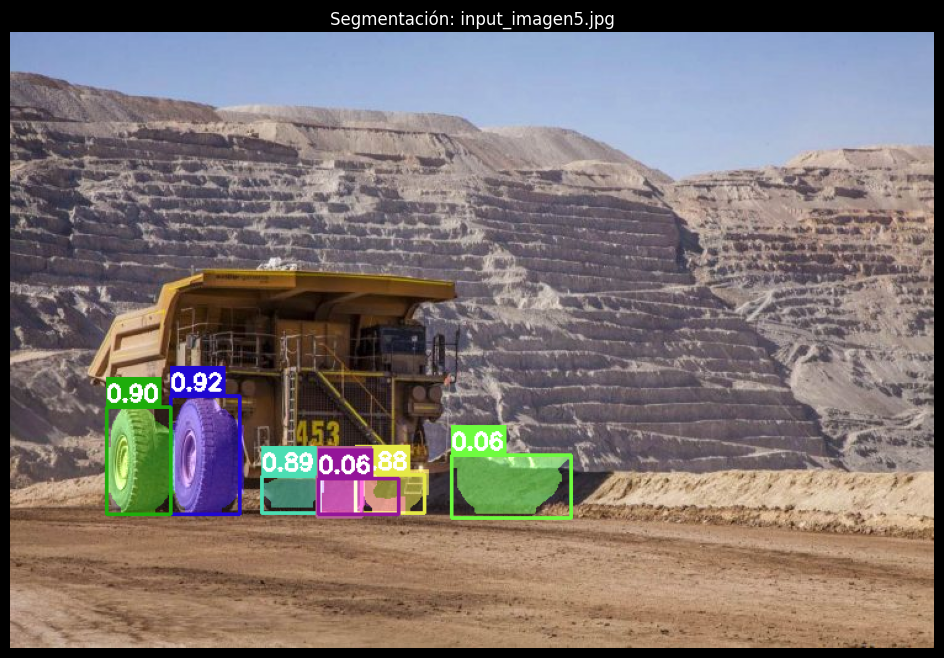

Área total segmentada: 14441.0 píxeles

--- REPORTE FINAL SEGMENTACIÓN ---
Total segmentaciones: 33
Área promedio por segmento: 2487.8
Relación área máscara/caja promedio: 0.74
Resultados guardados en: segmentaciones_resultados.csv


In [10]:
# 8. SEGMENTACIÓN PERSONALIZADA - Con umbral bajo

imagenes_disponibles = [
    f for f in os.listdir(".") if f.lower().endswith((".jpg", ".jpeg", ".png", ".bmp"))
]

# Configuracion de umbrales mínimos
UMBRAL_MINIMO = 0.05

if imagenes_disponibles:
    print(f"Encontradas {len(imagenes_disponibles)} imágenes:")
    for img in imagenes_disponibles:
        print(f"  - {img}")

    print(f"\nProcesando con umbral mínimo: {UMBRAL_MINIMO}")

    resultados_finales = []

    for img in imagenes_disponibles:
        print(f"\n--- Segmentando: {img} ---")
        df_resultado = segmentar_objetos(
            img, umbral_confianza=UMBRAL_MINIMO, mostrar=True
        )

        if df_resultado is not None and len(df_resultado) > 0:
            resultados_finales.append(df_resultado)
            print(
                f"Área total segmentada: {df_resultado['area_mascara'].sum():.1f} píxeles"
            )

    # DataFrame final
    if resultados_finales:
        df_final = pd.concat(resultados_finales, ignore_index=True)
        print(f"\n--- REPORTE FINAL SEGMENTACIÓN ---")
        print(f"Total segmentaciones: {len(df_final)}")
        print(f"Área promedio por segmento: {df_final['area_mascara'].mean():.1f}")
        print(
            f"Relación área máscara/caja promedio: {(df_final['area_mascara']/df_final['area_caja']).mean():.2f}"
        )

        df_final.to_csv("segmentaciones_resultados.csv", index=False)
        print("Resultados guardados en: segmentaciones_resultados.csv")

else:
    print("No hay imágenes disponibles para segmentación")

Encontradas 5 imágenes:
  - input_imagen1.jpg
  - input_imagen2.jpg
  - input_imagen3.jpg
  - input_imagen4.jpg
  - input_imagen5.jpg

Procesando con umbral mínimo: 0.35

--- Segmentando: input_imagen1.jpg ---

Imagen: input_imagen1.jpg
Segmentaciones encontradas: 5
Confianza promedio: 0.758
Área promedio (píxeles): 4825.2


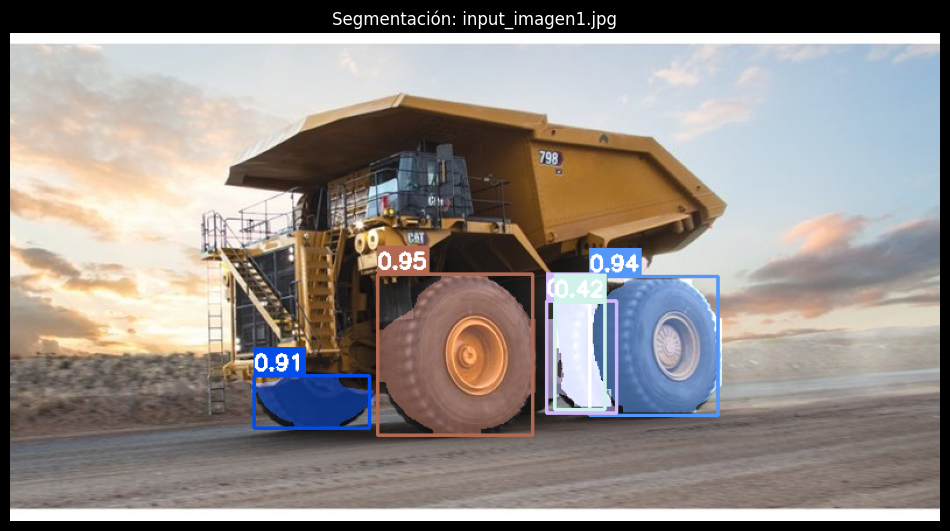

Área total segmentada: 24126.0 píxeles

--- Segmentando: input_imagen2.jpg ---

Imagen: input_imagen2.jpg
Segmentaciones encontradas: 2
Confianza promedio: 0.923
Área promedio (píxeles): 3724.0


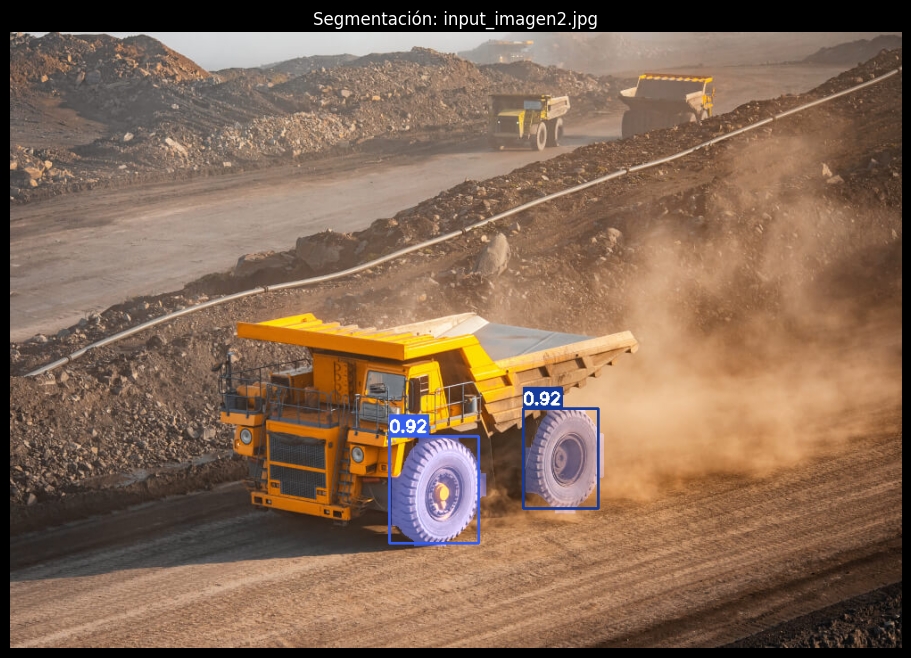

Área total segmentada: 7448.0 píxeles

--- Segmentando: input_imagen3.jpg ---

Imagen: input_imagen3.jpg
Segmentaciones encontradas: 3
Confianza promedio: 0.911
Área promedio (píxeles): 5279.7


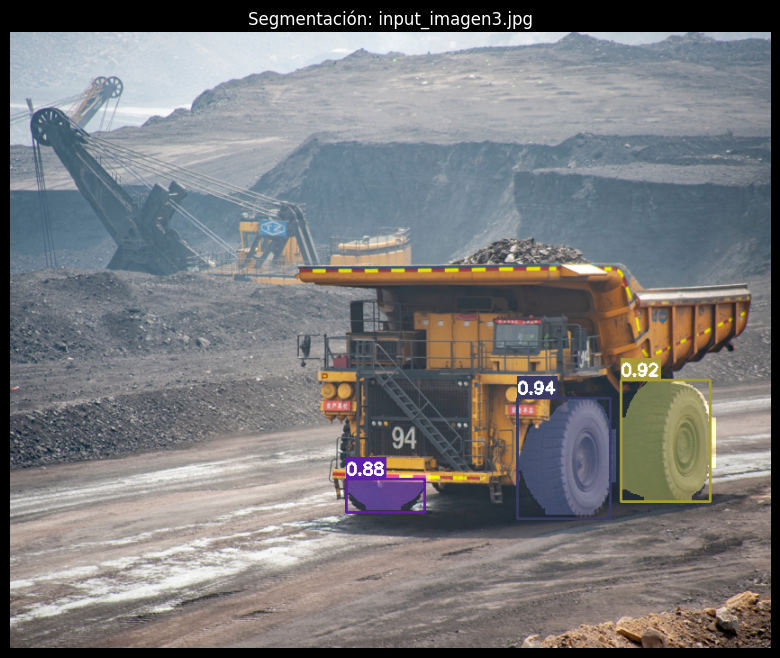

Área total segmentada: 15839.0 píxeles

--- Segmentando: input_imagen4.jpg ---

Imagen: input_imagen4.jpg
Segmentaciones encontradas: 5
Confianza promedio: 0.863
Área promedio (píxeles): 2718.6


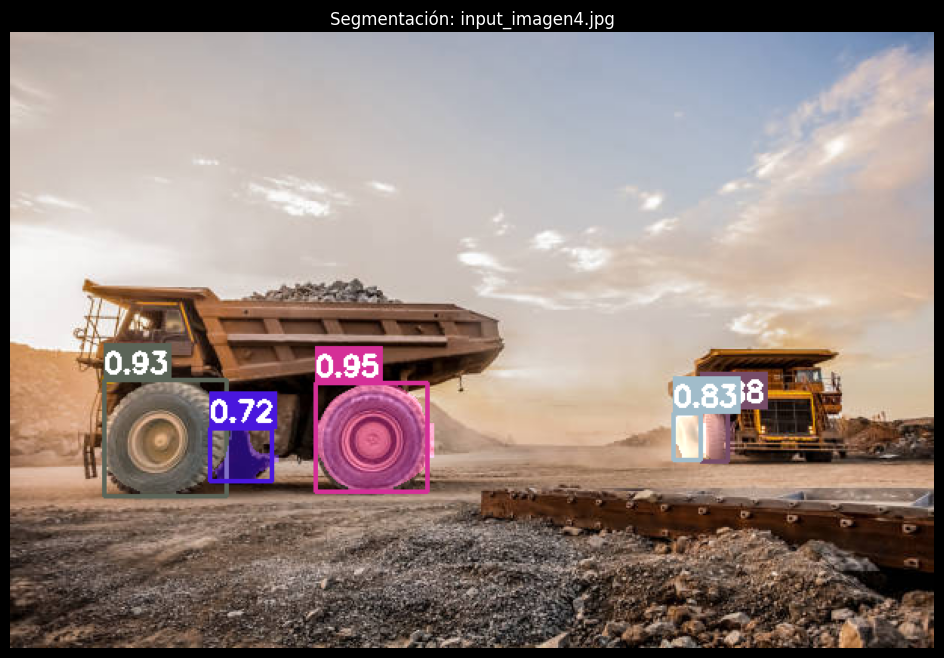

Área total segmentada: 13593.0 píxeles

--- Segmentando: input_imagen5.jpg ---

Imagen: input_imagen5.jpg
Segmentaciones encontradas: 5
Confianza promedio: 0.875
Área promedio (píxeles): 2045.4


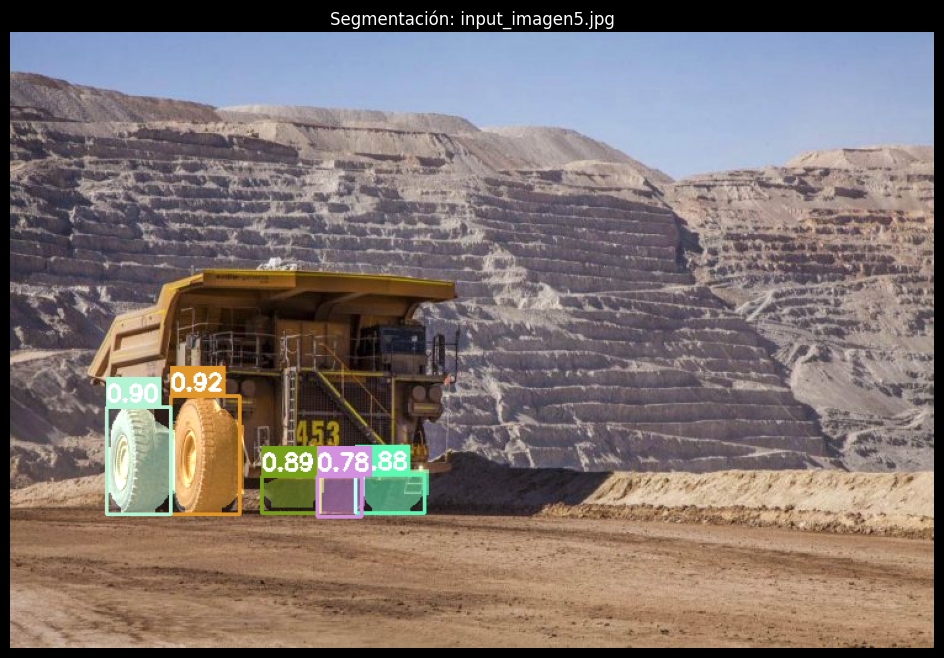

Área total segmentada: 10227.0 píxeles

--- REPORTE FINAL SEGMENTACIÓN ---
Total segmentaciones: 20
Área promedio por segmento: 3561.7
Relación área máscara/caja promedio: 0.69
Resultados guardados en: segmentaciones_resultados.csv


In [11]:
# 8. SEGMENTACIÓN PERSONALIZADA - Con umbral mas alto

imagenes_disponibles = [
    f for f in os.listdir(".") if f.lower().endswith((".jpg", ".jpeg", ".png", ".bmp"))
]

# Configuracion de umbrales mínimos
UMBRAL_MINIMO = 0.35

if imagenes_disponibles:
    print(f"Encontradas {len(imagenes_disponibles)} imágenes:")
    for img in imagenes_disponibles:
        print(f"  - {img}")

    print(f"\nProcesando con umbral mínimo: {UMBRAL_MINIMO}")

    resultados_finales = []

    for img in imagenes_disponibles:
        print(f"\n--- Segmentando: {img} ---")
        df_resultado = segmentar_objetos(
            img, umbral_confianza=UMBRAL_MINIMO, mostrar=True
        )

        if df_resultado is not None and len(df_resultado) > 0:
            resultados_finales.append(df_resultado)
            print(
                f"Área total segmentada: {df_resultado['area_mascara'].sum():.1f} píxeles"
            )

    # DataFrame final
    if resultados_finales:
        df_final = pd.concat(resultados_finales, ignore_index=True)
        print(f"\n--- REPORTE FINAL SEGMENTACIÓN ---")
        print(f"Total segmentaciones: {len(df_final)}")
        print(f"Área promedio por segmento: {df_final['area_mascara'].mean():.1f}")
        print(
            f"Relación área máscara/caja promedio: {(df_final['area_mascara']/df_final['area_caja']).mean():.2f}"
        )

        df_final.to_csv("segmentaciones_resultados.csv", index=False)
        print("Resultados guardados en: segmentaciones_resultados.csv")

else:
    print("No hay imágenes disponibles para segmentación")

____

Referencias y Agradecimientos

- Roboflow por proporcionar una plataforma accesible para la gestión de datasets de visión computacional
- Ultralytics y los desarrolladores de YOLOv11 por mantener y desarrollar herramientas open-source de alta calidad
- Los creadores de YOLOv12 por sus contribuciones a la investigación en detección de objetos
- La comunidad open-source que hace posible el acceso a estas tecnologías para propósitos educativos

IMPORTANTE: Solo tiene fines de aprendizaje personal, sin fines de lucro o aplicación industrial

```bibtex
@article{tian2025yolov12,
  title={YOLOv12: Attention-Centric Real-Time Object Detectors},
  author={Tian, Yunjie and Ye, Qixiang and Doermann, David},
  journal={arXiv preprint arXiv:2502.12524},
  year={2025}
}
```

```bibtex
@software{yolo11_ultralytics,
  author = {Glenn Jocher and Jing Qiu},
  title = {Ultralytics YOLO11},
  version = {11.0.0},
  year = {2024},
  url = {https://github.com/ultralytics/ultralytics},
  license = {AGPL-3.0}
}
```

```bibtex
@software{roboflow,
  author = {Dwyer, B. and Nelson, J. and Hansen, T. and others},
  title = {Roboflow},
  version = {1.0},
  year = {2025},
  url = {https://roboflow.com}
}
```